<h1>Modelo de Classificação de Cicatrizes de Queimada - Área de interesse: regiões próximas a linhas de transmissão </h1>

<i>Objetivo:</i> Criar o modelo ensemble para a área 220_065. 

Versão: mar/2019 - by Olga Bittencourt

In [1]:
'''
Passos:

Pré-processamento do conjunto
- Leitura de dados
- Visualização geral dos conjunto
- Alterações estatísticas nos atributos necessários
- Limpeza dos dados

Criação do modelo
- Busca dos parâmetros mais adequados
- Montagem do modelo

Teste
- Teste do modelo criado
- Validação do modelo com conjunto distinto
- Salvamento do modelo
- Salvamento do resultado da modelagem
'''

'\nPassos:\n\nPr\xc3\xa9-processamento do conjunto\n- Leitura de dados\n- Visualiza\xc3\xa7\xc3\xa3o geral dos conjunto\n- Altera\xc3\xa7\xc3\xb5es estat\xc3\xadsticas nos atributos necess\xc3\xa1rios\n- Limpeza dos dados\n\nCria\xc3\xa7\xc3\xa3o do modelo\n- Busca dos par\xc3\xa2metros mais adequados\n- Montagem do modelo\n\nTeste\n- Teste do modelo criado\n- Valida\xc3\xa7\xc3\xa3o do modelo com conjunto distinto\n- Salvamento do modelo\n- Salvamento do resultado da modelagem\n'

In [2]:
#Imports
#We'll use a familiar stack of data science libraries: Pandas, numpy, matplotlib, seaborn, and eventually sklearn for modeling.

# encoding: utf-8

import sys
# Manipulação de dados
import pandas as pd
import numpy as np

# Visualisation
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from pandas.tools.plotting import parallel_coordinates

# Configure visualisations
%matplotlib inline
mpl.style.use( 'ggplot' )

# use Seaborn styles
sns.set

import plotly
plotly.offline.init_notebook_mode() # run at the start of every ipython notebook

In [3]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier

from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.classifier import StackingCVClassifier
from sklearn.svm import SVC
import numpy as np

from sklearn.model_selection import train_test_split

/Users/olga/anaconda/envs/geop/lib/python2.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning:

numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.



<h2>Leitura de dados</h2>

In [4]:
# Arquivo de dados, formato csv
filename = ("./dados/conhecimento_220_065.csv")
# Leitura do arquivo e armazenamento em um dataframe(estrutura de dados pandas como uma tabela de colunas e linhas) 
full = pd.read_csv(filename)
#full2 = pd.read_csv(filename2)

In [5]:
#Visão geral do conjunto de dados de entrada: 

print ("O dataframe é formado por {0} linhas e {1} colunas.".format(full.shape[0],full.shape[1]))
print full.columns

print ("\nAmostra de 3 linhas:")
print full.head(3)

O dataframe é formado por 4112 linhas e 19 colunas.
Index([u'ndvi', u'nbrl', u'dif_ndvi', u'dif_dnbrl', u'medianb1', u'medianb2',
       u'medianb3', u'medianb4', u'medianb5', u'medianb6', u'medianb7', u'id',
       u'id_cena', u'orb_pto', u'data_pas', u'ano', u'area_ha', u'verifica',
       u'focos'],
      dtype='object')

Amostra de 3 linhas:
       ndvi      nbrl  dif_ndvi  dif_dnbrl  medianb1  medianb2  medianb3  \
0  0.375318  0.059309  0.239399   0.555211       NaN  0.100589  0.083812   
1  0.326283  0.136436  0.198616   0.376084       NaN  0.132626  0.122863   
2  0.286217  0.226745  0.249477   0.256783       NaN  0.118515  0.100956   

   medianb4  medianb5  medianb6  medianb7      id           id_cena  orb_pto  \
0  0.080614  0.178525  0.227362  0.159450  661194  LS82200652017102  220_065   
1  0.131785  0.256508  0.281116  0.195017  661195  LS82200652017102  220_065   
2  0.093326  0.179864  0.172601  0.119889  661198  LS82200652017102  220_065   

     data_pas   ano  area_

<h2>Pré processamento</h2>
<h3>Limpeza: Retirada de dados desnecessários ao modelo </h3>

In [6]:
# id_cena, orb_pto, data_pas
# medianb1: atributo não utilizado no Landsat8

full.drop([u'medianb1','orb_pto','id_cena'], axis=1, inplace=True) 

In [7]:
# Pré processamento para retirar os nulos do conjunto
# checking for missing values
print("Existem valores nulos? {}".format(full.isnull().any()))
# preenche NaN com float, se existirem
print ("Total de valores nulos foram alterados: {}".format(full.fillna(0.0, inplace=True)))

Existem valores nulos? ndvi         False
nbrl         False
dif_ndvi     False
dif_dnbrl    False
medianb2     False
medianb3     False
medianb4     False
medianb5     False
medianb6     False
medianb7     False
id           False
data_pas     False
ano          False
area_ha      False
verifica     False
focos        False
dtype: bool
Total de valores nulos foram alterados: None


In [8]:
# Pré processamento auxiliar
# Alteração do nome da coluna para compatibilidade com conjuntos anteriores

full.rename(columns={'verifica':'auditoria'}, inplace=True)
print full.columns

# facilitar algumas visualizacoes finais

def classex(value):
    if (value == 3): return 'Non Burned'
    return 'Burned'
full['class'] = (map (lambda x:classex(x), full.auditoria))


Index([u'ndvi', u'nbrl', u'dif_ndvi', u'dif_dnbrl', u'medianb2', u'medianb3',
       u'medianb4', u'medianb5', u'medianb6', u'medianb7', u'id', u'data_pas',
       u'ano', u'area_ha', u'auditoria', u'focos'],
      dtype='object')


<h2>Inclusão de estimativas de índices de vegetação relevantes </h2>

In [9]:
# Outros índices de vegetação

def calcula_mirbi(b7,b6):
    return ((10*b7) - (9.8*b6) + 2)

def calcula_ndwi(b3,b6):
    return ((b3-b6) / (b3 +b6))

def calcula_bai(b4,b5):
    return (1/((pow((0.1-b4),2))+(pow((0.06-b5),2))))

def calcula_gemi(b5,b7):
    n = (2*(pow(b7,2)- pow(b5,2)) + 1.5*b7 + 0.5*b5)/(b7 + b5 + 0.5)
    return (n * (1- 0.25*n) * (b5 - 0.125) / (1-b5))

def calcula_csi(b2,b6):
    return b2/b6


full['csi'] = (map (lambda y,z:calcula_csi(y,z), full.medianb2,full.medianb6))
full['bai'] = (map (lambda y,z:calcula_bai(y,z), full.medianb4,full.medianb5))
full['mirbi'] = (map (lambda y,z:calcula_mirbi(y,z), full.medianb7,full.medianb6))
full['ndwi'] = (map (lambda y,z:calcula_ndwi(y,z), full.medianb3,full.medianb6))
full['gemi'] = (map (lambda y,z:calcula_gemi(y,z), full.medianb5,full.medianb7))
full['gemiL'] = (map (lambda y,z:calcula_gemi(y,z), full.medianb5,full.medianb6))

In [10]:
# Inserir a informação de época chuvosa, seca ou transição
# pois elas trazem pequenas alterações nos valores médios das bandas e os índices

from datetime import datetime, timedelta
seca = [5,6,7,8] 
transicao_para_chuva = [9,10] 
transicao_para_seca = [4]
chuvosa = [11,12,1,2,3]

def classifica_estacao(value):
    if (value in seca): return 3
    if (value in transicao_para_chuva): return 4
    if (value in transicao_para_seca): return 2
    return 1

full["month"] = map(lambda x:(datetime.strptime(x,'%Y-%m-%d').month),full["data_pas"])
full['est'] = (map (lambda x:classifica_estacao(x), full.month))

cl_est = pd.get_dummies(full.est , prefix='ClEst' )
cl_est.head()
#full.drop(['est'],axis =1, inplace=True)

'''
# Testar se alguma das cnas está faltando no conjunto
# porque isso afeta o classificador quando for aplicado a outro conjunto
column_list = ['ClEst_1','ClEst_2','ClEst_3']
for col in column_list:
    if col not in cl_est.columns:
        cl_est[col] = 0
'''

full = pd.concat( [ full , cl_est ] , axis=1 )

In [11]:
def classey(value):
    if (value == 2): return 'Rainy2Dry'
    elif (value == 4): return 'Dry2Rainy'
    elif (value == 3): return 'Dry'
    return 'Rainy'
full['estacao'] = (map (lambda x:classey(x), full.est))

full.drop(['est'],axis =1, inplace=True)

Text(0.5,1,"Distribution of polgygon's number by seasonality")

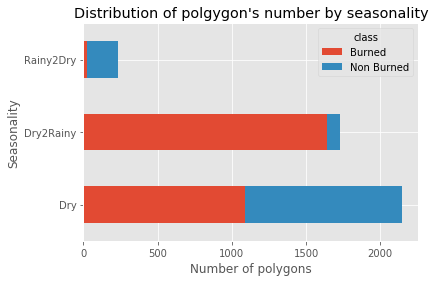

In [12]:
df2 = full.groupby(['estacao','class'])['class'].count().unstack('class').fillna(0)

df2.plot(kind='barh', stacked=True)

plt.xlabel('Number of polygons')
plt.ylabel('Seasonality')
plt.title("Distribution of polgygon's number by seasonality")


In [13]:
full.drop(['estacao'],axis =1, inplace=True)
full.rename(columns={'ClEst_1':'Rainy'}, inplace=True)
full.rename(columns={'ClEst_2':'Dry'}, inplace=True)
full.rename(columns={'ClEst_3':'Dry2Rainy'}, inplace=True)
full.rename(columns={'ClEst_4':'Rainy2Dry'}, inplace=True)
print full.columns

Index([u'ndvi', u'nbrl', u'dif_ndvi', u'dif_dnbrl', u'medianb2', u'medianb3',
       u'medianb4', u'medianb5', u'medianb6', u'medianb7', u'id', u'data_pas',
       u'ano', u'area_ha', u'auditoria', u'focos', u'class', u'csi', u'bai',
       u'mirbi', u'ndwi', u'gemi', u'gemiL', u'month', u'Dry', u'Dry2Rainy',
       u'Rainy2Dry'],
      dtype='object')


In [14]:
print full.columns

Index([u'ndvi', u'nbrl', u'dif_ndvi', u'dif_dnbrl', u'medianb2', u'medianb3',
       u'medianb4', u'medianb5', u'medianb6', u'medianb7', u'id', u'data_pas',
       u'ano', u'area_ha', u'auditoria', u'focos', u'class', u'csi', u'bai',
       u'mirbi', u'ndwi', u'gemi', u'gemiL', u'month', u'Dry', u'Dry2Rainy',
       u'Rainy2Dry'],
      dtype='object')


In [15]:
print full['class'].value_counts().to_frame().to_latex()

\begin{tabular}{lr}
\toprule
{} &  class \\
\midrule
Burned     &   2753 \\
Non Burned &   1359 \\
\bottomrule
\end{tabular}



In [16]:
#full["year"] = map(lambda x:(datetime.strptime(x,'%Y-%m-%d').year),full["data_pas"])

data_220 = full['data_pas'].unique()

#print full.groupby(['data_pas'])['year'].count().fillna(0).to_latex()

In [17]:
print full.groupby(['class'])['area_ha'].sum().fillna(0).to_latex()

\begin{tabular}{lr}
\toprule
{} &    area\_ha \\
class      &            \\
\midrule
Burned     &  126381.69 \\
Non Burned &   40297.77 \\
\bottomrule
\end{tabular}



In [18]:
# Verificação dos dadados agrupados por data, auditoria
print full.groupby('data_pas')['auditoria'].value_counts()

data_pas    auditoria
2017-04-12  3            213
            1             23
2017-06-15  3            285
            1             36
2017-07-01  3             84
            1             54
2017-07-17  1             91
            3             68
2017-08-02  1            142
            3             21
2017-08-18  1            214
            3             20
2017-09-03  1            200
            3             18
2017-10-05  1            308
            3              7
2017-10-21  1            315
            3              6
2018-05-17  3            109
            1              9
2018-06-02  3            211
            1             19
2018-06-18  3            160
            1             29
2018-07-04  1             71
            3             31
2018-07-20  1             98
            3             34
2018-08-05  1            167
            3              8
2018-08-21  1            160
            3             28
2018-09-22  1            325
            3        

In [19]:
df2 = full.groupby(['data_pas','class'])['class'].count().unstack('class').fillna(0)

print df2.Burned.sum()

2753


In [20]:
def print_tabela(clf, coluna, valor, funcao, label):
    
    table = pd.pivot_table(full,index=[clf],columns=coluna,values= valor,aggfunc=funcao,
                           fill_value=0, margins=True)
    print '\nClassificação {} por {}:\n{}\n'.format(clf,label,table)
    table.plot(kind='bar',title=label)
    
    print table.to_latex()
    
    #usava o valor total da linha
    #table_p = table.div(table.iloc[:,-1], axis=0 )*100
   
    table_p = (table.div(table.All[-1])*100).round(decimals=2)
    #print '\nClassificação {} por {}:\n{}\n'.format(clf,label+' (percentual)',table_p)
       
    #table_p.plot(kind='bar',title=label+' (percentual)')
    
    return


#df2 = full.groupby(['data_pas','class'])['class'].count().unstack('class').fillna(0)

all_data = [['2018-12-27' , '2018-12-11',
 '2018-11-25', '2018-11-09',
 '2018-10-24', '2018-10-08',
 '2018-09-22', '2018-09-06',
 '2018-08-05' ,'2018-07-20',
 '2018-07-04', '2018-06-18',
 '2018-06-02', '2018-05-17',
 '2018-05-01', '2018-04-15',
 '2018-03-30', '2018-03-14',
 '2018-02-26', '2018-02-10',
 '2018-01-25', '2018-01-09',
 '2017-12-24', '2017-12-08',
 '2017-11-22', '2017-11-06',
 '2017-10-21', '2017-10-05',
 '2017-09-19', '2017-09-03',
 '2017-08-18', '2017-08-02',
 '2017-07-17', '2017-07-01',
 '2017-06-15', '2017-05-30',
 '2017-05-14', '2017-04-28',
 '2017-04-12', '2017-03-27',
 '2017-03-11', '2017-02-23',
 '2017-02-07', '2017-01-22',
 '2017-01-06']]

#print all_data

for data in all_data:

    #if data not in data_220: print data

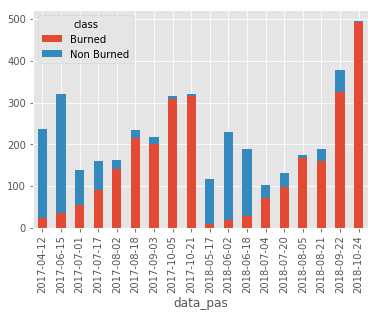

In [21]:
#colors = {'Burned': 'r', 'Non Burned': 'g'}
#df2.plot(kind='bar', stacked=True, color=[colors[i] for i in full['auditoria']])

df2 = full.groupby(['data_pas','class'])['class'].count().unstack('class').fillna(0)

df2.plot(kind='bar', stacked=True)
plt.savefig("numero_total_poligonos.png")

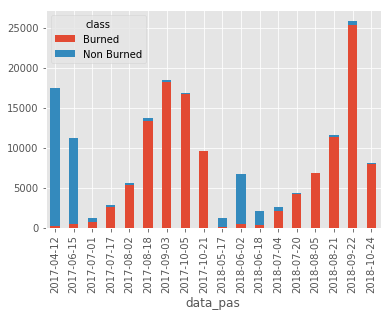

In [22]:
df2 = full.groupby(['data_pas','class'])['area_ha'].sum().unstack('class').fillna(0)

#df2 = full.groupby(['month', 'auditoria'])['month'].count().unstack('auditoria').fillna(0)
df2.plot(kind='bar', stacked=True)
plt.savefig("area_ocupada_poligonos.png")

#print_tabela('data_pas', 'auditoria', 'area_ha', 'sum', 'Data x auditoria')

In [23]:
table = pd.pivot_table(full,index=['month'],columns=['class'],values= ['area_ha'],aggfunc=sum,
                           fill_value=0, margins=True)
print '\nClassificação :\n{}\n'.format(table)




Classificação :
         area_ha                      
class     Burned Non Burned        All
month                                 
4         199.26   17253.27   17452.53
5         102.24    1068.48    1170.72
6        1366.74   18691.56   20058.30
7        9754.29    1224.81   10979.10
8       36902.43     959.22   37861.65
9       43648.83     813.60   44462.43
10      34407.90     286.83   34694.73
All    126381.69   40297.77  166679.46



In [24]:
#table = pd.crosstab(full.tam,full.auditoria)
#table.plot(kind='bar',width=1.0, color=['red','green'], title='Indicacao para Queimadas' ,grid=False)

In [25]:
full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4112 entries, 0 to 4111
Data columns (total 27 columns):
ndvi         4112 non-null float64
nbrl         4112 non-null float64
dif_ndvi     4112 non-null float64
dif_dnbrl    4112 non-null float64
medianb2     4112 non-null float64
medianb3     4112 non-null float64
medianb4     4112 non-null float64
medianb5     4112 non-null float64
medianb6     4112 non-null float64
medianb7     4112 non-null float64
id           4112 non-null int64
data_pas     4112 non-null object
ano          4112 non-null int64
area_ha      4112 non-null float64
auditoria    4112 non-null int64
focos        4112 non-null int64
class        4112 non-null object
csi          4112 non-null float64
bai          4112 non-null float64
mirbi        4112 non-null float64
ndwi         4112 non-null float64
gemi         4112 non-null float64
gemiL        4112 non-null float64
month        4112 non-null int64
Dry          4112 non-null uint8
Dry2Rainy    4112 non-null uint8

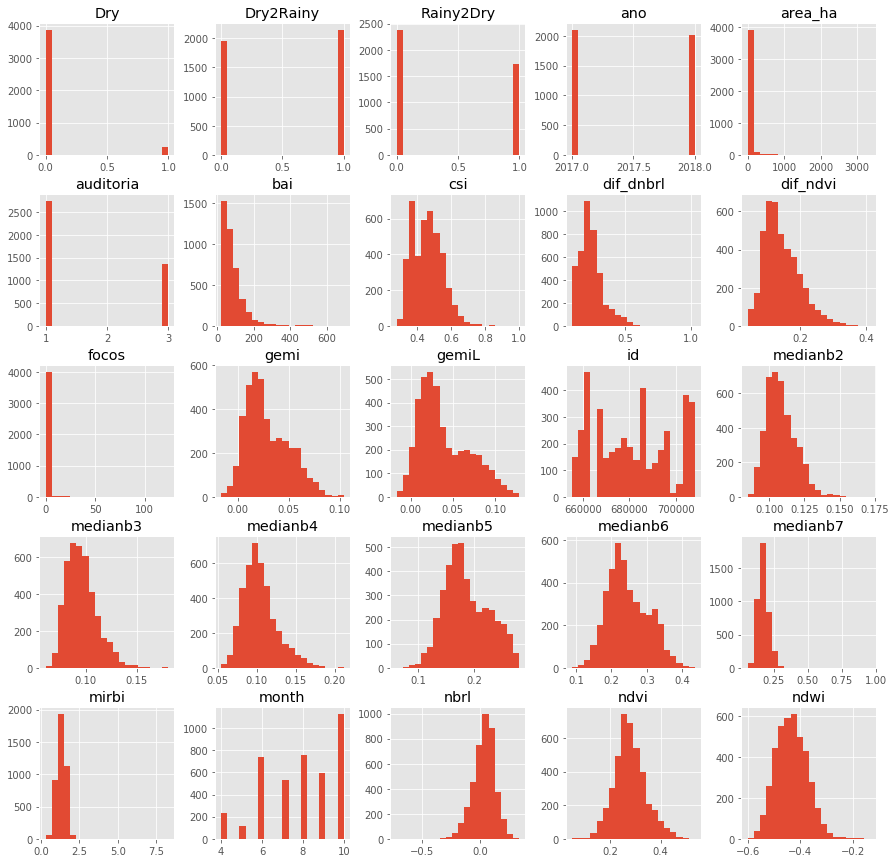

In [26]:
full.hist(bins=20, figsize=(15, 15))
plt.show()

/Users/olga/anaconda/envs/geop/lib/python2.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



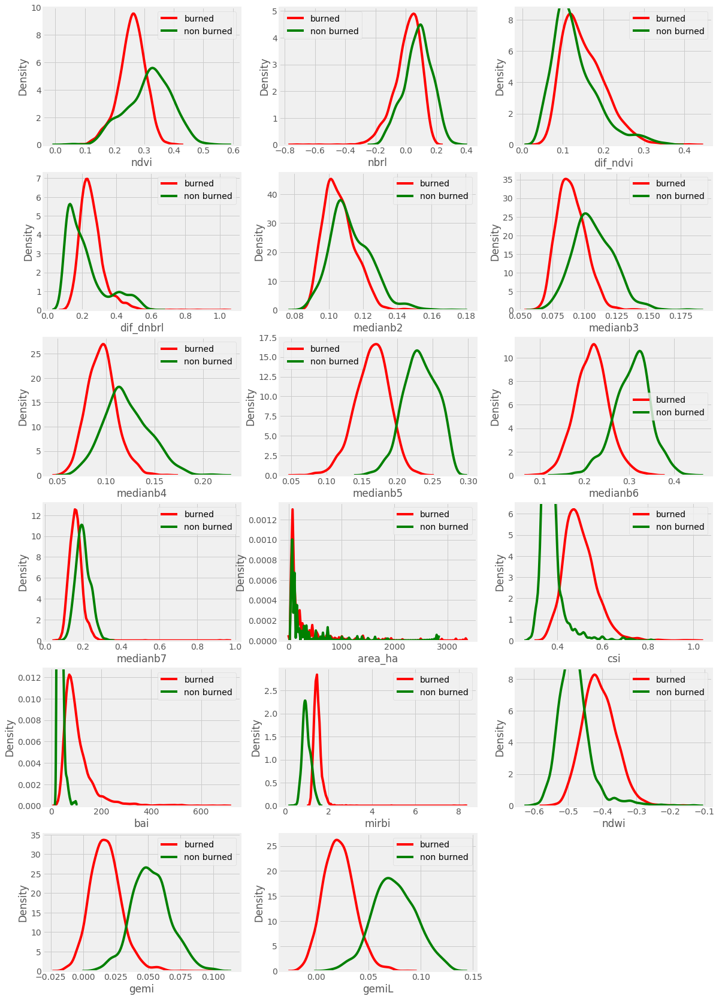

In [27]:
# Visualizar a distribuição dos conjuntos em relação à classificação

from collections import OrderedDict

plt.figure(figsize = (20, 16))
plt.style.use('fivethirtyeight')

# Color mapping
colors = OrderedDict({1: 'red', 3: 'green'})
burned_mapping = OrderedDict({1: 'burned', 3: 'non burned'})

# Iterate through the float columns
for i, col in enumerate(full.select_dtypes('float')):
    ax = plt.subplot(8, 3, i + 1)
    # Iterate through the poverty levels
    for burned_level, color in colors.items():
        # Plot each poverty level as a separate line
        sns.kdeplot(full.loc[full['auditoria'] == burned_level, col].dropna(), 
                    ax = ax, color = color, label = burned_mapping[burned_level])
        
    #plt.title(f"{col.capitalize()} Distribution");
    plt.xlabel(col); 
    plt.ylabel('Density')

plt.subplots_adjust(top = 2)

In [28]:
# Visão geral do conjunto de dados
print ("\nResumo estatístico do conjunto:")
print full.describe()


Resumo estatístico do conjunto:
              ndvi         nbrl     dif_ndvi    dif_dnbrl     medianb2  \
count  4112.000000  4112.000000  4112.000000  4112.000000  4112.000000   
mean      0.277741     0.033258     0.145355     0.244640     0.108462   
std       0.063331     0.096023     0.054449     0.091010     0.010598   
min       0.046629    -0.722620     0.041464     0.101423     0.084738   
25%       0.237780    -0.024056     0.104795     0.186993     0.100779   
50%       0.273011     0.041813     0.134168     0.231543     0.106907   
75%       0.314819     0.096771     0.178421     0.284969     0.114730   
max       0.537093     0.337581     0.412579     1.027677     0.171748   

          medianb3     medianb4     medianb5     medianb6     medianb7  \
count  4112.000000  4112.000000  4112.000000  4112.000000  4112.000000   
mean      0.095778     0.104354     0.186965     0.246597     0.175129   
std       0.015080     0.021972     0.039885     0.057254     0.043096   
min 

<h2>Ajuste das curvas</h2>

Verificar índices com distribuições alongadas e com outliers. 

In [29]:
def stat_ajust(x):
    if (x == 0): return 0
    return np.log(x)/10

full['log_mirbi'] = (map (lambda x:stat_ajust(x), full.mirbi))
#full.drop('mirbi', axis=1, inplace=True) 

full['log_bai'] = (map (lambda x:stat_ajust(x), full.bai))
#full.drop('bai', axis=1, inplace=True) 

full['log_area'] = (map (lambda x:stat_ajust(x), full.area_ha))
#full.drop('area_ha', axis=1, inplace=True) 

full.drop('focos', axis=1, inplace=True) 


In [30]:
print full.columns

Index([u'ndvi', u'nbrl', u'dif_ndvi', u'dif_dnbrl', u'medianb2', u'medianb3',
       u'medianb4', u'medianb5', u'medianb6', u'medianb7', u'id', u'data_pas',
       u'ano', u'area_ha', u'auditoria', u'class', u'csi', u'bai', u'mirbi',
       u'ndwi', u'gemi', u'gemiL', u'month', u'Dry', u'Dry2Rainy',
       u'Rainy2Dry', u'log_mirbi', u'log_bai', u'log_area'],
      dtype='object')


In [31]:
print full.head(2)

       ndvi      nbrl  dif_ndvi  dif_dnbrl  medianb2  medianb3  medianb4  \
0  0.375318  0.059309  0.239399   0.555211  0.100589  0.083812  0.080614   
1  0.326283  0.136436  0.198616   0.376084  0.132626  0.122863  0.131785   

   medianb5  medianb6  medianb7    ...         ndwi      gemi     gemiL  \
0  0.178525  0.227362  0.159450    ...    -0.461316  0.022226  0.029418   
1  0.256508  0.281116  0.195017    ...    -0.391735  0.061381  0.084610   

   month  Dry Dry2Rainy  Rainy2Dry  log_mirbi   log_bai  log_area  
0      4    1         0          0   0.031214  0.423886  0.251204  
1      4    1         0          0   0.017834  0.322828  0.085015  

[2 rows x 29 columns]


In [32]:
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import plotly.plotly as py
from plotly import tools
import plotly.figure_factory as ff

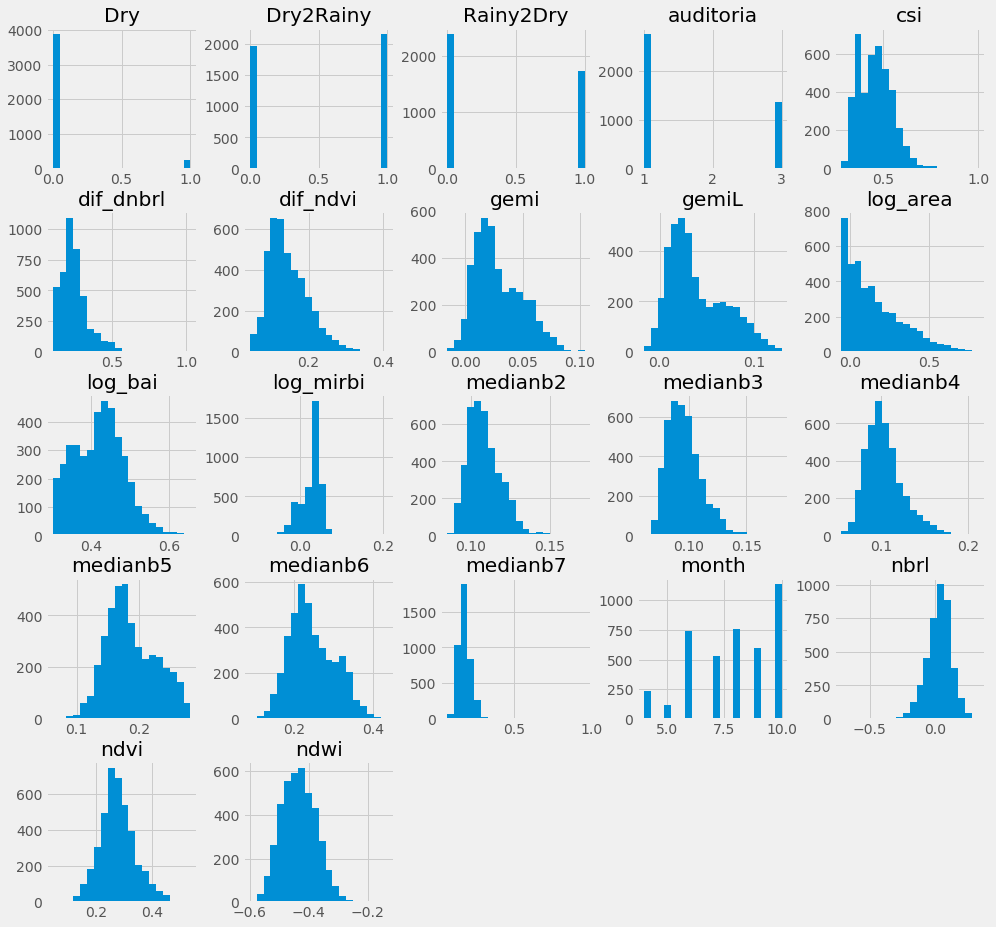

In [33]:
## list of features to be used
# separar colunas não úteis
features = [c for c in full.columns if c not in [ 'id','ano','data','area_ha','mirbi','bai']]

full[features].hist(bins=20, figsize=(15, 15))
plt.show()

In [34]:
from collections import OrderedDict

# Color mapping
colors = OrderedDict({1: 'red', 3: 'green'})
burned_mapping = OrderedDict({1: 'burned', 3: 'non burned'})


In [35]:
#full.sample(100).plot.scatter(x='area',y='focos')

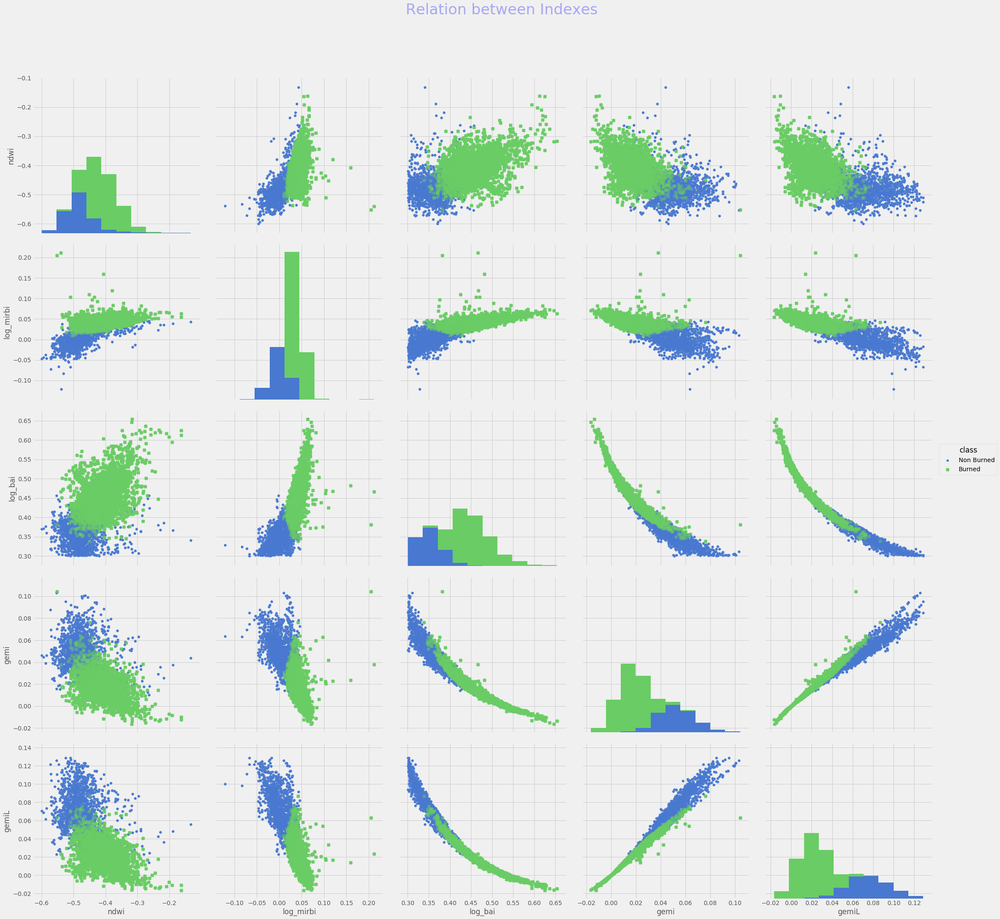

In [36]:
# Create a Pairplot
g = sns.pairplot(full,hue="class",palette="muted",size=6,
    vars = ['ndwi','log_mirbi','log_bai','gemi','gemiL'],
            markers=['o','x'])

# To change the size of the scatterpoints in graph
g = g.map_offdiag(plt.scatter,s=35,alpha=0.5)

# remove the top and right line in graph
sns.despine()
# Additional line to adjust some appearance issue
plt.subplots_adjust(top=0.9)

# Set the Title of the graph from here
g.fig.suptitle('Relation between Indexes',
    fontsize=34,color="b",alpha=0.3)

g.savefig("output_relations.png")

<h2> Verificando o balanceamento do conjunto </h2>

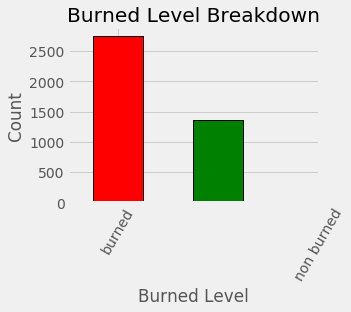

In [37]:
def geral(counts):

    # Bar plot of occurrences of each label
    counts.plot.bar(figsize = (4, 3), color = colors.values(),
                      edgecolor = 'k', linewidth = 1)

    # Formatting
    plt.xlabel('Burned Level'); 
    plt.ylabel('Count'); 
    plt.xticks([x - 1 for x in burned_mapping.keys()], 
           list(burned_mapping.values()), rotation = 60)
    plt.title('Burned Level Breakdown');

    # Heads of household
# Labels for full_training
full_train_labels = full.loc[(full['auditoria'].notnull()), ['auditoria', 'id']]

# Value counts of target
full_label_counts = full_train_labels['auditoria'].value_counts().sort_index()

geral(full_label_counts)


In [38]:
def boxs(col, title):
    y1 = full[full['auditoria'] == 1][col]
    y3 = full[full['auditoria'] == 3][col]

    trace1 = go.Box(y=y1, name="Burned", marker=dict(color="red", opacity=0.7))
    trace3 = go.Box(y=y3, name="Non burned", marker=dict(color="green", opacity=0.7))

    data = [trace1,  trace3]
    return data 
    layout = dict(title=title, showlegend=False, height=400)
    data = [trace1, trace3]
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)


In [39]:

titles = [ "B2", "B3", "B4", "B5", "B6", "B7"]
fig = tools.make_subplots(rows=2, cols=3, print_grid=False, subplot_titles=titles)

res = boxs("medianb2", "Number of")
for x in res:
    fig.append_trace(x, 1, 1)
res = boxs("medianb3", "Number of")
for x in res:
    fig.append_trace(x, 1, 2)
res = boxs("medianb4", "Number of")
for x in res:
    fig.append_trace(x, 1, 3)
res = boxs("medianb5", "Number of")
for x in res:
    fig.append_trace(x, 2, 1)
res = boxs("medianb6", "Number of")
for x in res:
    fig.append_trace(x, 2, 2)
res = boxs("medianb7", "Number of")
for x in res:
    fig.append_trace(x, 2, 3)


fig['layout'].update(height=400, title="", barmode="stack", showlegend=False)
iplot(fig)

In [40]:
titles = [ "NDVI", "dif_NDVI", "NBR", "dif_NBR","NDWI", "GEMI", "GEMIL","CSI"]
fig = tools.make_subplots(rows=2, cols=4, print_grid=False, subplot_titles=titles)

res = boxs("ndvi", "Number of")
for x in res:
    fig.append_trace(x, 1, 1)
res = boxs("dif_ndvi", "Number of")
for x in res:
    fig.append_trace(x, 1, 2)
res = boxs("nbrl", "Number of")
for x in res:
    fig.append_trace(x, 1, 3)
    res = boxs("dif_dnbrl", "Number of")
for x in res:
    fig.append_trace(x, 1, 4)
res = boxs("ndwi", "Number of")
for x in res:
    fig.append_trace(x, 2, 1)
res = boxs("gemi", "Number of")
for x in res:
    fig.append_trace(x, 2, 2)
res = boxs("gemiL", "Number of")
for x in res:
    fig.append_trace(x, 2, 3)   
    res = boxs("csi", "Number of")
for x in res:
    fig.append_trace(x, 2, 4)   
fig['layout'].update(height=400, title="", barmode="stack", showlegend=False)
iplot(fig)

In [41]:
titles = [ "area", "MIRBI" , "BAI","log_area", "log_MIRBI" , "log_BAI"]
fig = tools.make_subplots(rows=2, cols=3, print_grid=False, subplot_titles=titles)

res = boxs("area_ha", "Number of")
for x in res:
    fig.append_trace(x, 1, 1)
res = boxs("mirbi", "Number of")
for x in res:
    fig.append_trace(x, 1, 2)
res = boxs("bai", "Number of")
for x in res:
    fig.append_trace(x, 1, 3)
res = boxs("log_area", "Number of")
for x in res:
    fig.append_trace(x, 2, 1)
res = boxs("log_mirbi", "Number of")
for x in res:
    fig.append_trace(x, 2, 2)
res = boxs("log_bai", "Number of")
for x in res:
    fig.append_trace(x, 2, 3)


fig['layout'].update(height=400, title="", barmode="stack", showlegend=False)
iplot(fig)

titles = [ "ClTam_1", "ClTam_2", "ClTam_3" , "ClTam_4", "ClTam_5"]
fig = tools.make_subplots(rows=2, cols=3, print_grid=False, subplot_titles=titles)

res = boxs("ClTam_1", "Number of")
for x in res:
    fig.append_trace(x, 1, 1)
res = boxs("ClTam_2", "Number of")
for x in res:
    fig.append_trace(x, 1, 2)
res = boxs("ClTam_3", "Number of")
for x in res:
    fig.append_trace(x, 1, 3)
res = boxs("ClTam_4", "Number of")
for x in res:
    fig.append_trace(x, 2, 1)
res = boxs("ClTam_5", "Number of")
for x in res:
    fig.append_trace(x, 2, 2)



fig['layout'].update(height=400, title="", barmode="stack", showlegend=False)
iplot(fig)

                Dry  Dry2Rainy  Rainy2Dry  auditoria       csi  dif_dnbrl  \
Dry        1.000000  -0.258180  -0.209974   0.300079 -0.215559   0.528393   
Dry2Rainy -0.258180   1.000000  -0.890349   0.360989 -0.124307  -0.268867   
Rainy2Dry -0.209974  -0.890349   1.000000  -0.506741  0.227384   0.023089   
auditoria  0.300079   0.360989  -0.506741   1.000000 -0.683939  -0.175653   
csi       -0.215559  -0.124307   0.227384  -0.683939  1.000000   0.163682   
dif_dnbrl  0.528393  -0.268867   0.023089  -0.175653  0.163682   1.000000   
dif_ndvi  -0.176610   0.298938  -0.219302  -0.188495  0.476768   0.379656   
gemi       0.250216   0.117822  -0.237154   0.783998 -0.781865  -0.239088   
gemiL      0.255852   0.173852  -0.296513   0.827471 -0.787506  -0.250514   
log_area  -0.003174  -0.069942   0.072279  -0.176039  0.187073   0.219983   
log_bai   -0.197697  -0.156229   0.251273  -0.764649  0.785392   0.322278   
log_mirbi -0.290414  -0.300230   0.440698  -0.802241  0.732155   0.289923   

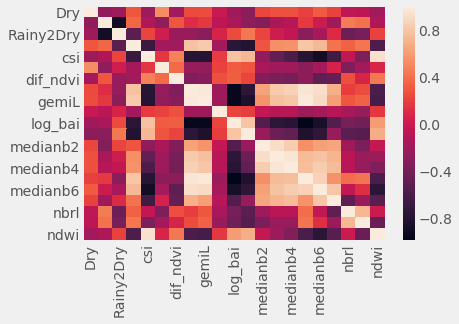

In [42]:
# Verificando as correlações entre os atributos

meta = full.columns.difference([ u'data_pas','tam', 'data','id','focos', 'area_ha','mirbi','bai','class',
                               'month', 'ano'])

corr = full[meta].corr()
print(corr)
sns.heatmap(corr, annot = False)

In [43]:
# Retirar atributos com correlação acima de 0.97
# decidi não tirar bai e b5
#full.drop('medianb2',axis=1,inplace=True)
#full.drop('medianb3',axis=1,inplace=True)

#meta = full.columns.difference([ u'data_pas','data','id','focos', 'area_ha'])
#corr = full[meta].corr()
#print(corr)
#sns.heatmap(corr, annot = False)

<h2> Funçoes auxiliares de visualização </h2>

In [44]:
def mostra_resultado(clf,data,pred):
    mat = confusion_matrix(data, pred)
    sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
    plt.xlabel('true label')
    plt.ylabel('predicted label')
    plt.show()
    print(classification_report(data,pred))




In [45]:
#Teste com predição do modelo completo para o conjunto completo.

def monta_resultado(clf,pos,neg,X1,y1):
   
    print "Conjunto de teste"
    prd_clf = clf.predict(X1) 
    prd_proba_clf = clf.predict_proba(X1)

    #mostra_resultado(clf,y1,prd_clf,pos,neg)
    mostra_resultado(clf,y1,prd_clf)
        
    #temp = pd.DataFrame(prd,columns=[label])
    temp = pd.DataFrame(prd_proba_clf,columns=[(label+'_'+pos),(label+'_'+neg)])
    temp[label] = pd.DataFrame(prd_clf)
    
    #print temp
    #del prd_clf,prd_proba_clf
    return temp
   


# Início da Análise

In [46]:
#plt.scatter(full[:, 0], full[:, 1], c='ndwi', s=50, cmap='auditoria');

In [47]:
knn = KNeighborsClassifier(n_neighbors=3)
rf = RandomForestClassifier(random_state=1986, min_samples_leaf= 2, n_estimators= 48,
                            class_weight='balanced_subsample', max_features='sqrt') 
nn = MLPClassifier(alpha= 0.0001, activation= 'relu',  max_iter= 500, hidden_layer_sizes= (100,))
lr = LogisticRegression()
stacking = StackingCVClassifier(classifiers=[rf,nn], use_probas=True, meta_classifier=lr)

from sklearn.svm import SVC # "Support vector classifier"
svm = SVC(kernel='linear', C=1E10)


<h1> Separando conjunto de treino e teste </h1>

<h2> Caso 1: Conjunto Aleatório </h2>

<h3> Teste: 70% total </h3>
<h3> Treino: 30% total </h3>

In [48]:
## list of features to be used
meta_colunas = ['data_pas', 'tam','auditoria','data','id','ano', 'estacao','mirbi','bai', 'est',
                                                 'area_ha','focos', 'month','class']
features = [c for c in full.columns if c not in meta_colunas]

## target variable 
target = full['auditoria'].values
target_index = {1:0, 3:1}
target = np.array([target_index[c] for c in target])

X_train, X_valid, y_train, y_valid = train_test_split(full[features].values, target,
                                                      test_size=0.3, random_state=1)

In [49]:
# checking for missing values
print("Das {0} amostras, o treinamento é formado por {1} dados e o conjunto de testes é formado por {2} dados. ".
      format(full.shape[0],X_train.shape[0],X_valid.shape[0]))

print full[features].columns

Das 4112 amostras, o treinamento é formado por 2878 dados e o conjunto de testes é formado por 1234 dados. 
Index([u'ndvi', u'nbrl', u'dif_ndvi', u'dif_dnbrl', u'medianb2', u'medianb3',
       u'medianb4', u'medianb5', u'medianb6', u'medianb7', u'csi', u'ndwi',
       u'gemi', u'gemiL', u'Dry', u'Dry2Rainy', u'Rainy2Dry', u'log_mirbi',
       u'log_bai', u'log_area'],
      dtype='object')


Index([], dtype='object')

***** Classifier: KNN ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.982 (+/- 0.013) 
('All: ', array([0.984     , 0.99193548, 0.96774194, 0.98373984, 1.        ,
       1.        , 0.95934959, 0.96747967, 0.97560976, 0.99186992]))
Conjunto de teste


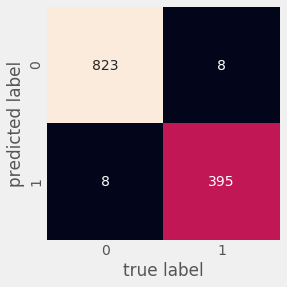

             precision    recall  f1-score   support

          0       0.99      0.99      0.99       831
          1       0.98      0.98      0.98       403

avg / total       0.99      0.99      0.99      1234


***** Classifier: SVM ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.954 (+/- 0.010) 
('All: ', array([0.96      , 0.94354839, 0.95967742, 0.93495935, 0.96747967,
       0.95934959, 0.96747967, 0.94308943, 0.95121951, 0.95121951]))
Conjunto de teste


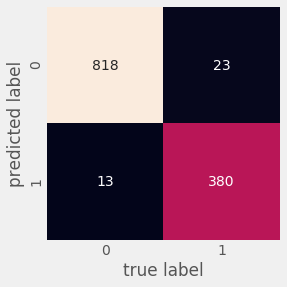

             precision    recall  f1-score   support

          0       0.97      0.98      0.98       831
          1       0.97      0.94      0.95       403

avg / total       0.97      0.97      0.97      1234


***** Classifier: RF ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.984 (+/- 0.012) 
('All: ', array([0.984     , 1.        , 0.97580645, 0.97560976, 1.        ,
       0.99186992, 0.98373984, 0.99186992, 0.97560976, 0.95934959]))
log_mirbi: 23.38%
gemiL: 21.23%
log_bai: 12.82%
medianb5: 11.65%
csi: 6.12%
gemi: 5.25%
medianb6: 4.96%
ndwi: 2.79%
nbrl: 2.13%
Rainy2Dry: 2.04%
ndvi: 1.88%
medianb3: 1.62%
dif_dnbrl: 0.75%
medianb4: 0.71%
medianb7: 0.62%
Dry: 0.59%
medianb2: 0.52%
Dry2Rainy: 0.45%
dif_ndvi: 0.36%
log_area: 0.13%
Conjunto de teste


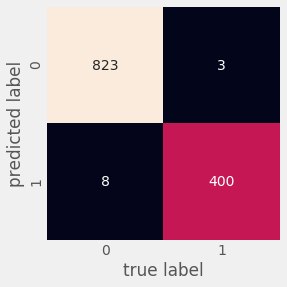

             precision    recall  f1-score   support

          0       1.00      0.99      0.99       831
          1       0.98      0.99      0.99       403

avg / total       0.99      0.99      0.99      1234


***** Classifier: NN ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.983 (+/- 0.008) 
('All: ', array([1.        , 0.97580645, 0.98387097, 0.98373984, 0.98373984,
       0.99186992, 0.98373984, 0.96747967, 0.98373984, 0.97560976]))
Conjunto de teste


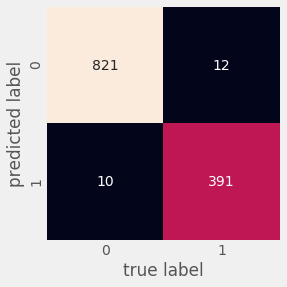

             precision    recall  f1-score   support

          0       0.99      0.99      0.99       831
          1       0.98      0.97      0.97       403

avg / total       0.98      0.98      0.98      1234


***** Classifier: ST ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.986 (+/- 0.010) 
('All: ', array([1.        , 0.99193548, 0.97580645, 0.97560976, 0.98373984,
       0.99186992, 0.99186992, 0.97560976, 1.        , 0.97560976]))
Conjunto de teste


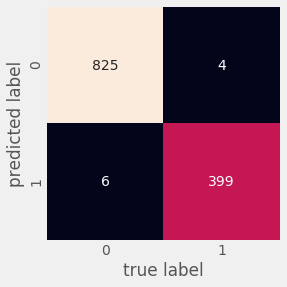

             precision    recall  f1-score   support

          0       1.00      0.99      0.99       831
          1       0.99      0.99      0.99       403

avg / total       0.99      0.99      0.99      1234

   KNN_1  KNN_3  KNN     SVM_1     SVM_3  SVM  RF_1  RF_3  RF      NN_1  \
0    0.0    1.0    1  0.000015  0.999985    1   0.0   1.0   1  0.000206   
1    1.0    0.0    0  0.993549  0.006451    0   1.0   0.0   0  0.987561   

       NN_3  NN      ST_1      ST_3  ST  
0  0.999794   1  0.003449  0.996551   1  
1  0.012439   0  0.995194  0.004806   0  


In [50]:
clf_result = pd.DataFrame()
clf_score = pd.DataFrame()

print clf_result.columns   

svm = SVC(gamma='auto', random_state=42, probability=True)

for clf, label in zip([ knn, svm,  rf, nn , stacking], 
                      ['KNN',
                       'SVM',
                       'RF', 
                       'NN',
                       'ST',
                        ]):

    print("\n***** Classifier: %s ***** " % (label))
    
    clf.fit(X_train,y_train)
    
    #print "Conjunto original de treinamento"
    #prd = clf.predict(X_train)
    #mostra_resultado(clf,y_train,prd)
 
    #print "Relatório de Acurácias - Conjunto Treino"
    #scores = model_selection.cross_val_score(clf, X_train, y_train, scoring='accuracy', cv=10)
    #print("Accuracy: %0.3f (+/- %0.3f) " % (scores.mean(), scores.std()))
 
    print "Relatório de Acurácias  - Conjunto Teste"
    scores2 = model_selection.cross_val_score(clf, X_valid,y_valid, 
                                              scoring='accuracy', cv=10)
    print("Accuracy: %0.3f (+/- %0.3f) " % (scores2.mean(), scores2.std()))
    print("All: " , scores2)

    if (clf==rf):
        features_importance = zip(clf.feature_importances_,features)
        for importance, feature in sorted(features_importance, reverse=True):
            print("%s: %0.2f%%" % (feature, importance*100))
    

    result = monta_resultado(clf,'1','3',X_valid,y_valid)
   
    temp_result = pd.concat([clf_result, result], axis=1)
    clf_result = temp_result
    
    temp = pd.DataFrame()
    temp[label] = scores2
    temp_score = pd.concat([clf_score,temp], axis=1)
    clf_score = temp_score
    
    del temp_result,temp

print clf_result.head(2)


In [51]:
clf_result.describe()

,KNN_1,KNN_3,KNN,SVM_1,SVM_3,SVM,RF_1,RF_3,RF,NN_1,NN_3,NN,ST_1,ST_3,ST
count,1234.000000,1234.000000,1234.000000,1.234000e+03,1.234000e+03,1234.000000,1234.000000,1234.000000,1234.000000,1.234000e+03,1.234000e+03,1234.000000,1234.000000,1234.000000,1234.000000
mean,0.673960,0.326040,0.326580,6.707232e-01,3.292768e-01,0.318476,0.667643,0.332357,0.330632,6.700692e-01,3.299308e-01,0.324959,0.668468,0.331532,0.328201
std,0.461592,0.461592,0.469152,4.386179e-01,4.386179e-01,0.466074,0.453121,0.453121,0.470631,4.491358e-01,4.491358e-01,0.468550,0.460444,0.460444,0.469749
min,0.000000,0.000000,0.000000,1.134669e-09,1.000000e-07,0.000000,0.000000,0.000000,0.000000,6.593270e-08,3.806456e-09,0.000000,0.003447,0.004615,0.000000
25%,0.000000,0.000000,0.000000,3.946633e-02,8.602883e-04,0.000000,0.014380,0.000000,0.000000,1.143358e-02,2.564814e-04,0.000000,0.004054,0.004619,0.000000
50%,1.000000,0.000000,0.000000,9.869560e-01,1.304396e-02,0.000000,1.000000,0.000000,0.000000,9.911350e-01,8.864998e-03,0.000000,0.995028,0.004972,0.000000
75%,1.000000,1.000000,1.000000,9.991397e-01,9.605337e-01,1.000000,1.000000,0.985620,1.000000,9.997435e-01,9.885664e-01,1.000000,0.995381,0.995946,1.000000
max,1.000000,1.000000,1.000000,9.999999e-01,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000e+00,9.999999e-01,1.000000,0.995385,0.996553,1.000000


In [52]:
print clf_score

        KNN       SVM        RF        NN        ST
0  0.984000  0.960000  0.984000  1.000000  1.000000
1  0.991935  0.943548  1.000000  0.975806  0.991935
2  0.967742  0.959677  0.975806  0.983871  0.975806
3  0.983740  0.934959  0.975610  0.983740  0.975610
4  1.000000  0.967480  1.000000  0.983740  0.983740
5  1.000000  0.959350  0.991870  0.991870  0.991870
6  0.959350  0.967480  0.983740  0.983740  0.991870
7  0.967480  0.943089  0.991870  0.967480  0.975610
8  0.975610  0.951220  0.975610  0.983740  1.000000
9  0.991870  0.951220  0.959350  0.975610  0.975610


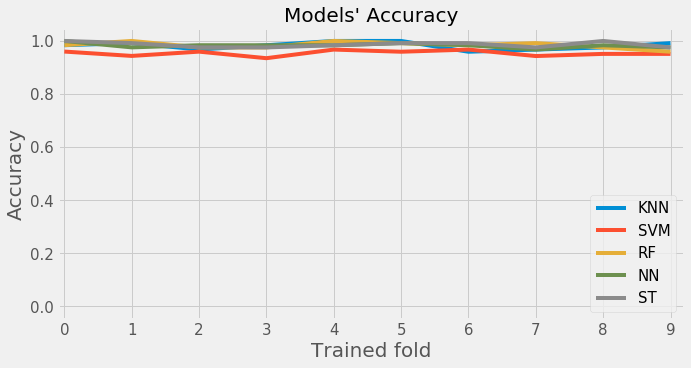

In [53]:
plt.figure(figsize=(10,5))
plt.plot(clf_score)

plt.rcParams['font.size'] = 14

axes = plt.gca()
axes.set_xlim([-0.1,9.2])
axes.set_ylim([-0.05,1.05])

fs=20
plt.yticks( fontsize=fs-5, rotation=0)
plt.xticks([(k) for k in range(10)], fontsize=fs-5, rotation=0)
axes.set_ylabel('Accuracy', rotation = 90, fontsize=fs)
axes.set_xlabel('Trained fold', rotation = 0, fontsize=fs)
axes.set_title('Models\' Accuracy', rotation = 0, fontsize=fs)

plt.legend(['KNN', 'SVM', 'RF', 'NN', 'ST'], loc='lower right', fontsize=fs-5)


<h2> Caso 2: Conhecimento do ano anterior </h2>

<h3> Teste: dados de 2017 </h3>
<h3> Treino: dados de 2018 </h3>

In [54]:
'''
# Manipulação das datas e seus formatos
from datetime import datetime, timedelta
#print (("Data de exemplo: {} ").format(full.data_pas))

# Alteração dentro do formato específico
full['data'] = (map (lambda y:(datetime.strptime(y,'%Y-%m-%d')),full.data_pas))

# Recuperação da maior data analisada
maxdata = full.data.max()
print ("Maior data encontrada: ", maxdata)
'''

'\n# Manipula\xc3\xa7\xc3\xa3o das datas e seus formatos\nfrom datetime import datetime, timedelta\n#print (("Data de exemplo: {} ").format(full.data_pas))\n\n# Altera\xc3\xa7\xc3\xa3o dentro do formato espec\xc3\xadfico\nfull[\'data\'] = (map (lambda y:(datetime.strptime(y,\'%Y-%m-%d\')),full.data_pas))\n\n# Recupera\xc3\xa7\xc3\xa3o da maior data analisada\nmaxdata = full.data.max()\nprint ("Maior data encontrada: ", maxdata)\n'

In [55]:
# Verificando dados não necessários
#features = full.columns.difference([u'data_pas'])
#full = full[features]

# Separando para treinamento todo o ano de 2017 e para teste todo o ano de 2018
ano_treinamento = 2017

df_train = full[full.ano == ano_treinamento]
df_test = full[full.ano > ano_treinamento]

#print df_test.head(2)

In [56]:
# Separar o conjunto de dados que será usado para treinar o modelo, sem o resultado
features = df_train.columns.difference(meta_colunas)
X_out = df_train[features].values
y_out = df_train.auditoria.values

# Separar o conjunto de dados que será usado para validar o modelo, sem o resultado
features_testar = df_test.columns.difference(meta_colunas)
X_out_testar = df_test[features_testar].values
y_out_testar = df_test.auditoria.values


In [57]:
print df_test[features_testar].columns

Index([u'Dry', u'Dry2Rainy', u'Rainy2Dry', u'csi', u'dif_dnbrl', u'dif_ndvi',
       u'gemi', u'gemiL', u'log_area', u'log_bai', u'log_mirbi', u'medianb2',
       u'medianb3', u'medianb4', u'medianb5', u'medianb6', u'medianb7',
       u'nbrl', u'ndvi', u'ndwi'],
      dtype='object')


In [58]:
# checking for missing values
print("Das {0} amostras, o treinamento é formado por {1} dados e o conjunto de testes é formado por {2} dados. ".
      format(full.shape[0],df_train.shape[0],df_test.shape[0]))


Das 4112 amostras, o treinamento é formado por 2105 dados e o conjunto de testes é formado por 2007 dados. 


In [59]:
#print full.head(5)

Index([], dtype='object')

***** Classifier: KNN ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.958 (+/- 0.072) 
('All: ', array([0.98507463, 0.9800995 , 0.98507463, 0.99004975, 0.99004975,
       0.98507463, 0.960199  , 0.995     , 0.965     , 0.745     ]))
Conjunto de teste


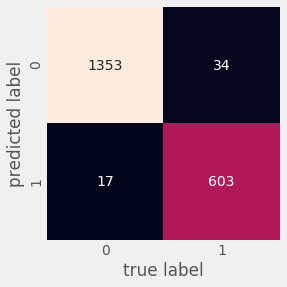

             precision    recall  f1-score   support

          1       0.98      0.99      0.98      1370
          3       0.97      0.95      0.96       637

avg / total       0.97      0.97      0.97      2007


***** Classifier: SVM ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.945 (+/- 0.077) 
('All: ', array([0.960199  , 0.97512438, 1.        , 1.        , 0.99004975,
       0.97014925, 0.95522388, 0.935     , 0.935     , 0.725     ]))
Conjunto de teste


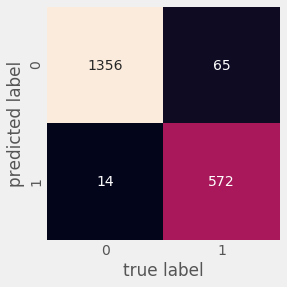

             precision    recall  f1-score   support

          1       0.95      0.99      0.97      1370
          3       0.98      0.90      0.94       637

avg / total       0.96      0.96      0.96      2007


***** Classifier: RF ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.982 (+/- 0.017) 
('All: ', array([0.98507463, 0.9800995 , 1.        , 0.99004975, 0.98507463,
       0.99004975, 0.99502488, 0.99      , 0.955     , 0.945     ]))
log_mirbi: 16.996%
log_bai: 16.519%
gemiL: 13.591%
csi: 12.977%
gemi: 8.675%
medianb6: 7.678%
medianb5: 6.968%
Rainy2Dry: 3.376%
ndvi: 2.933%
medianb3: 1.968%
nbrl: 1.697%
ndwi: 1.497%
Dry: 1.332%
medianb4: 1.235%
medianb2: 1.070%
dif_dnbrl: 0.519%
medianb7: 0.345%
dif_ndvi: 0.335%
Dry2Rainy: 0.204%
log_area: 0.084%
Conjunto de teste


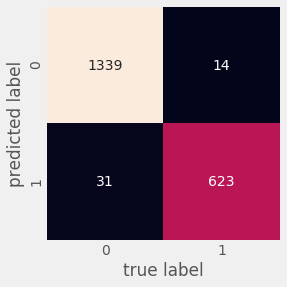

             precision    recall  f1-score   support

          1       0.99      0.98      0.98      1370
          3       0.95      0.98      0.97       637

avg / total       0.98      0.98      0.98      2007


***** Classifier: NN ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.964 (+/- 0.046) 
('All: ', array([0.960199  , 0.9800995 , 0.99502488, 0.99502488, 0.9800995 ,
       0.98507463, 0.97512438, 0.97      , 0.965     , 0.83      ]))
Conjunto de teste


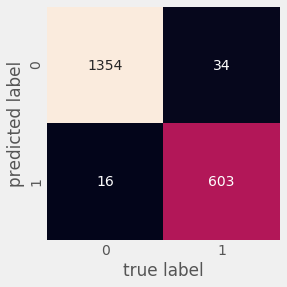

             precision    recall  f1-score   support

          1       0.98      0.99      0.98      1370
          3       0.97      0.95      0.96       637

avg / total       0.98      0.98      0.97      2007


***** Classifier: ST ***** 
Relatório de Acurácias  - Conjunto Teste
Accuracy: 0.978 (+/- 0.025) 
('All: ', array([0.98507463, 0.9800995 , 1.        , 0.99004975, 0.99004975,
       0.99004975, 0.99502488, 0.985     , 0.955     , 0.91      ]))
Conjunto de teste


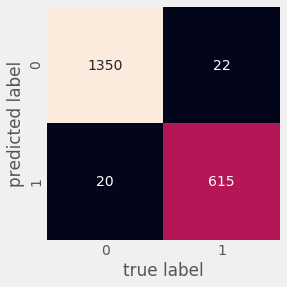

             precision    recall  f1-score   support

          1       0.98      0.99      0.98      1370
          3       0.97      0.97      0.97       637

avg / total       0.98      0.98      0.98      2007

   KNN_1  KNN_3  KNN     SVM_1     SVM_3  SVM      RF_1      RF_3  RF  \
0    0.0    1.0    3  0.017846  0.982154    3  0.007067  0.992933   3   
1    0.0    1.0    3  0.000012  0.999988    3  0.000000  1.000000   3   

       NN_1      NN_3  NN      ST_1      ST_3  ST  
0  0.003071  0.996929   3  0.003798  0.996202   3  
1  0.000229  0.999771   3  0.003610  0.996390   3  


In [60]:
clf_result = pd.DataFrame()
print clf_result.columns  
clf_score = pd.DataFrame()

#print clf_result.head(5)

for clf, label in zip([ knn, svm, rf, nn , stacking], 
                      ['KNN',
                       'SVM',
                       'RF', 
                       'NN',
                       'ST',
                        ]):

    print("\n***** Classifier: %s ***** " % (label))
    
    clf.fit(X_out,y_out)
    
    #print "Conjunto original de treinamento"
    #prd = clf.predict(X_out)
    #mostra_resultado(clf,y_out,prd)
 
    #print "Relatório de Acurácias - Conjunto Treino"
    #scores = model_selection.cross_val_score(clf, X_out, y_out, scoring='accuracy', cv=10)
    #print("Accuracy: %0.3f (+/- %0.3f) " % (scores.mean(), scores.std()))
 
    print "Relatório de Acurácias  - Conjunto Teste"
    scores2 = model_selection.cross_val_score(clf, X_out_testar,y_out_testar, 
                                              scoring='accuracy', cv=10)
    print("Accuracy: %0.3f (+/- %0.3f) " % (scores2.mean(), scores2.std()))
    print("All: " , scores2)
    
    if (clf==rf):
        features_importance = zip(clf.feature_importances_,features)
        for importance, feature in sorted(features_importance, reverse=True):
            print("%s: %0.3f%%" % (feature, importance*100))
   
    
    result = monta_resultado(clf,'1','3',X_out_testar,y_out_testar)
   
    temp_result = pd.concat([clf_result, result], axis=1)
    clf_result = temp_result
    
    temp = pd.DataFrame()
    temp[label] = scores2
    temp_score = pd.concat([clf_score,temp], axis=1)
    clf_score = temp_score
    
    
    del temp_result, temp_score
    
print clf_result.head(2)


In [61]:
print clf_score

        KNN       SVM        RF        NN        ST
0  0.985075  0.960199  0.985075  0.960199  0.985075
1  0.980100  0.975124  0.980100  0.980100  0.980100
2  0.985075  1.000000  1.000000  0.995025  1.000000
3  0.990050  1.000000  0.990050  0.995025  0.990050
4  0.990050  0.990050  0.985075  0.980100  0.990050
5  0.985075  0.970149  0.990050  0.985075  0.990050
6  0.960199  0.955224  0.995025  0.975124  0.995025
7  0.995000  0.935000  0.990000  0.970000  0.985000
8  0.965000  0.935000  0.955000  0.965000  0.955000
9  0.745000  0.725000  0.945000  0.830000  0.910000


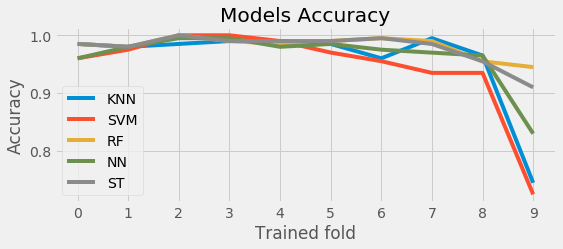

In [62]:
plt.figure(figsize=(8,3))
plt.plot(clf_score)
plt.title('Models Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Trained fold')

plt.xticks([(k) for k in range(10)])
plt.legend(['KNN', 'SVM', 'RF', 'NN', 'ST'], loc='lower left')
#plt.legend(['logreg', 'tree', 'randomforest', 'ann', 'svm'], loc='upper left')
plt.savefig("output_score.png")



In [63]:
print clf_result.describe()

             KNN_1        KNN_3          KNN         SVM_1         SVM_3  \
count  2007.000000  2007.000000  2007.000000  2.007000e+03  2.007000e+03   
mean      0.693905     0.306095     1.617838  7.064423e-01  2.935577e-01   
std       0.451147     0.451147     0.924325  4.260139e-01  4.260139e-01   
min       0.000000     0.000000     1.000000  6.727779e-08  1.000000e-07   
25%       0.000000     0.000000     1.000000  1.267963e-01  3.414087e-04   
50%       1.000000     0.000000     1.000000  9.944668e-01  5.533221e-03   
75%       1.000000     1.000000     3.000000  9.996586e-01  8.732037e-01   
max       1.000000     1.000000     3.000000  9.999999e-01  9.999999e-01   

               SVM         RF_1         RF_3           RF          NN_1  \
count  2007.000000  2007.000000  2007.000000  2007.000000  2.007000e+03   
mean      1.583956     0.668193     0.331807     1.651719  6.876285e-01   
std       0.909571     0.440423     0.440423     0.937624  4.439075e-01   
min       1.000

In [64]:
result = pd.concat([df_test.reset_index(drop=True), clf_result.reset_index(drop=True)], axis=1)

#result = pd.concat([df_test, clf_result], ignore_index=True,axis=1)

#df_test = df_test.append(clf_result) 

print "Conjunto específico usado no treinamento..."
print  ".... a recuperação do modelo deve seguir esse conjunto!"
print df_train[features].columns

print df_train[features].shape

#print result.shape
print result.head()

result.to_csv("./resultado_ensemble_220_065.csv")

Conjunto específico usado no treinamento...
.... a recuperação do modelo deve seguir esse conjunto!
Index([u'Dry', u'Dry2Rainy', u'Rainy2Dry', u'csi', u'dif_dnbrl', u'dif_ndvi',
       u'gemi', u'gemiL', u'log_area', u'log_bai', u'log_mirbi', u'medianb2',
       u'medianb3', u'medianb4', u'medianb5', u'medianb6', u'medianb7',
       u'nbrl', u'ndvi', u'ndwi'],
      dtype='object')
(2105, 20)
       ndvi      nbrl  dif_ndvi  dif_dnbrl  medianb2  medianb3  medianb4  \
0  0.397777  0.150637  0.117056   0.171854  0.104108  0.095042  0.092687   
1  0.326161  0.027635  0.119025   0.168080  0.104260  0.097777  0.117201   
2  0.406801  0.157463  0.130444   0.173913  0.109654  0.101930  0.100005   
3  0.222103 -0.124042  0.059695   0.179782  0.118568  0.113807  0.130724   
4  0.326634  0.015791  0.215262   0.526307  0.118821  0.110211  0.127431   

   medianb5  medianb6  medianb7 ...  SVM      RF_1      RF_3  RF      NN_1  \
0  0.218295  0.269880  0.161366 ...    3  0.007067  0.992933   3  0.0

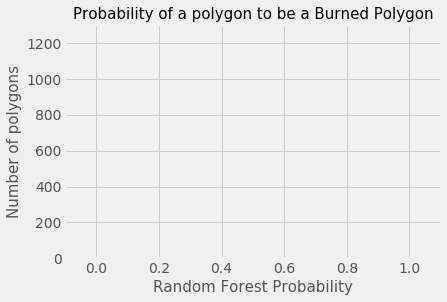

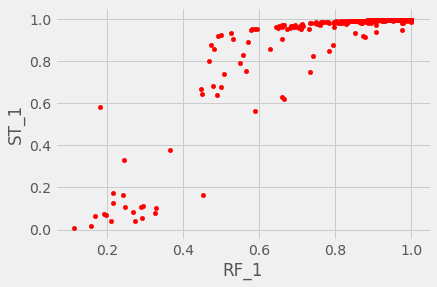

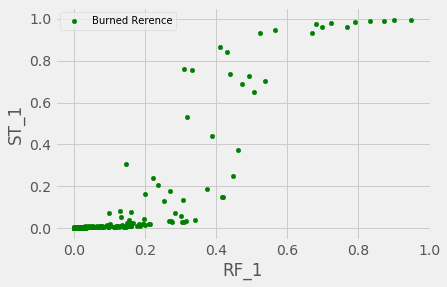

In [72]:
axes = plt.gca()
axes.set_xlim([-0.1,1.1])
axes.set_ylim([-0.05,1300])

fs = 15
plt.ylabel('Number of polygons', rotation = 90, fontsize=fs)
plt.xlabel('Random Forest Probability', rotation = 0, fontsize=fs)
plt.title('Probability of a polygon to be a Burned Polygon', rotation = 0, fontsize=fs)
ax = result[result['class']=='Burned'].plot(kind='scatter',x='RF_1',y='ST_1',color = 'r')
bx = result[result['class']=='Non Burned'].plot(kind='scatter',x='RF_1',y='ST_1',color = 'g')
plt.legend(['Burned Rerence', 'Non Burned Reference'], loc='upper left', fontsize=fs-5)



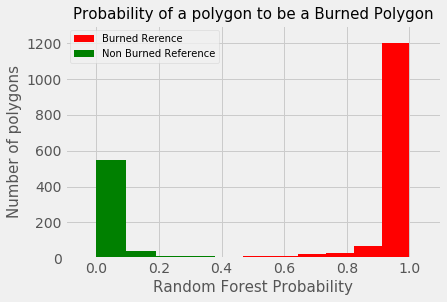

In [66]:
axes = plt.gca()
axes.set_xlim([-0.1,1.1])
axes.set_ylim([-0.05,1300])

fs = 15
plt.ylabel('Number of polygons', rotation = 90, fontsize=fs)
plt.xlabel('Random Forest Probability', rotation = 0, fontsize=fs)
plt.title('Probability of a polygon to be a Burned Polygon', rotation = 0, fontsize=fs)
result[result['class']=='Burned'].RF_1.hist(color = 'r', bins =10)
result[result['class']=='Non Burned'].RF_1.hist(color = 'g', bins = 10)
plt.legend(['Burned Rerence', 'Non Burned Reference'], loc='upper left', fontsize=fs-5)



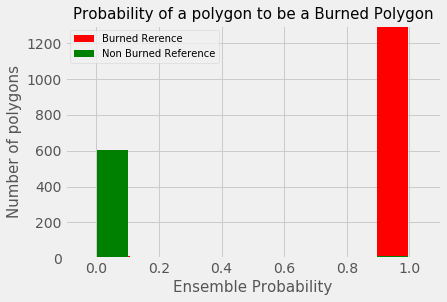

In [67]:

axes = plt.gca()
axes.set_xlim([-0.1,1.1])
axes.set_ylim([-0.05,1300])

fs = 15
plt.ylabel('Number of polygons', rotation = 90, fontsize=fs)
plt.xlabel('Ensemble Probability', rotation = 0, fontsize=fs)
plt.title('Probability of a polygon to be a Burned Polygon', rotation = 0, fontsize=fs)
result[result['class']=='Burned'].ST_1.hist(color = 'r', bins = 10)
result[result['class']=='Non Burned'].ST_1.hist(color = 'g', bins = 10)
plt.legend(['Burned Rerence', 'Non Burned Reference'], loc='upper left', fontsize=fs-5)



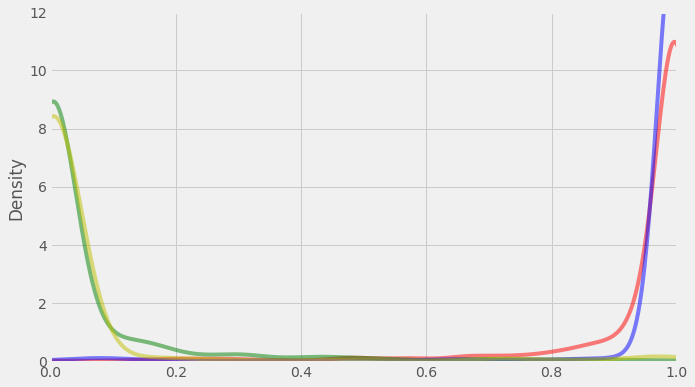

In [73]:
result['RFclass'] = (map (lambda x:classex(x), result.ST_1))

axes = plt.gca()
axes.set_xlim([-0.0,1])
axes.set_ylim([-0.05,12])

ax1 = result[result['class']=='Burned'].RF_1.plot.kde(
    figsize=(10,6), color='r', label='QMD - Auditor', alpha=0.5)
ax2 = result[result['class']=='Non Burned'].RF_1.plot.kde(
    figsize=(10,6), color='g', label='NQMD - Auditor', alpha=0.5)
ax3 = result[result['class']=='Burned'].ST_1.plot.kde(
    figsize=(10,6), color='b', label='QMD - Auditor', alpha=0.5)
ax4 = result[result['class']=='Non Burned'].ST_1.plot.kde(
    figsize=(10,6), color='y', label='NQMD - Auditor', alpha=0.5)
ax.legend();

# Get the two lines from the axes to generate shading
l1 = ax1.lines[0]
l2 = ax1.lines[1]

# Get the xy data from the lines so that we can shade

x1 = l1.get_xydata()[:,0]
y1 = l1.get_xydata()[:,1]
x2 = l2.get_xydata()[:,0]
y2 = l2.get_xydata()[:,1]
ax.fill_between(x1,y1, color="red", alpha=0.3)
ax.fill_between(x2,y2, color="blue", alpha=0.3)

plt.show()

In [69]:
result.columns

Index([u'ndvi', u'nbrl', u'dif_ndvi', u'dif_dnbrl', u'medianb2', u'medianb3',
       u'medianb4', u'medianb5', u'medianb6', u'medianb7', u'id', u'data_pas',
       u'ano', u'area_ha', u'auditoria', u'class', u'csi', u'bai', u'mirbi',
       u'ndwi', u'gemi', u'gemiL', u'month', u'Dry', u'Dry2Rainy',
       u'Rainy2Dry', u'log_mirbi', u'log_bai', u'log_area', u'KNN_1', u'KNN_3',
       u'KNN', u'SVM_1', u'SVM_3', u'SVM', u'RF_1', u'RF_3', u'RF', u'NN_1',
       u'NN_3', u'NN', u'ST_1', u'ST_3', u'ST', u'RFclass'],
      dtype='object')

In [ ]:

# Salvar o modelo para ser usado em outro conjunto

from sklearn.externals import joblib
stacking.fit(X_out,y_out)
filename = 'model_Stacking_220_065_v2_mar.sav'
joblib.dump(stacking, filename)


In [ ]:
'''
# Teste de carregamento do modelo de um arquivo com posterior utilização desse modelo

from sklearn.externals import joblib
filename = "./model_Stacking_220_065_v1.sav"
loaded_model = joblib.load(filename)
#result = loaded_model.score(features_train,labels_test)
print loaded_model

# Testar o modelo com os dados conhecidos pelo próprio modelo
predictions_train_stacking = loaded_model.predict(features_train)

# Buscar o modelo probabilístico com os dados conhecidos
predictions_proba_train_stacking = loaded_model.predict_proba(features_train)

full['Stacking'] = predictions_train_stacking
full['Stacking_R'] = predictions_proba_train_stacking[:,0]

print full.describe()
'''